In [20]:
import nltk
nltk.download('wordnet')
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
import nltk,sys
from nltk.corpus import stopwords
import nltk.data
from nltk.stem.porter import *
import csv,re
import numpy as np,pandas as pd
import matplotlib.pyplot as plt

from tkinter import * 

pd.options.mode.chained_assignment = None


[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\pc\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\pc\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\pc\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [21]:
import os
import glob
import pandas as pd
def get_merged_csv(flist, **kwargs):

    return pd.concat([pd.read_csv(f, **kwargs,sep=',') for f in flist], ignore_index=True)


path = 'C:/Users/pc/FD/dataset2'

fmask = os.path.join(path, '*some*.csv')


#df = get_merged_csv(glob.glob(fmask), index_col=None, usecols=['col1', 'col3'])

df = get_merged_csv(glob.glob(fmask),error_bad_lines=False, index_col=None,usecols=['likes', 'text'])


print(df.head())
df.shape

                                                text  likes
0  If you believe in the work we're doing to keep...    4.0
1                                                NaN    NaN
2                                                NaN    NaN
3                                                NaN    NaN
4                                                NaN    NaN


(15065, 2)

In [22]:
new_df=df.dropna(thresh=2)
print(new_df.head())
new_df.shape

                                                 text  likes
0   If you believe in the work we're doing to keep...    4.0
7          Oh the irony..\nEqual rights... and lefts!    0.0
8                  Ahhhh.... typical idiotic feminist    0.0
9                       WHO'S THE MAN IN CHARGE HERE?    0.0
10                                       Thanks Obama    0.0


(6589, 2)

In [23]:
print('\n------- Enlever la ponctuation ------- \n')
import string
new_df['text']=new_df.text.apply(str)
def remove_punctuation(text):
    no_punct="".join([c for c in text if c not in string.punctuation])
    return no_punct
new_df['text']=new_df['text'].apply (lambda x : remove_punctuation (x)) 
print(new_df['text'])



------- Enlever la ponctuation ------- 

0        If you believe in the work were doing to keep ...
7                      Oh the ironynEqual rights and lefts
8                           Ahhhh typical idiotic feminist
9                              WHOS THE MAN IN CHARGE HERE
10                                            Thanks Obama
11       After castrating men why is it such a surprise...
12                          These 5 chicks look like dudes
13                                           Fuck Feminism
14                               Equality os always needed
15                   MORE SEWERAGE WORKERSnSHOULD BE WOMEN
16                                      thank youfeminists
17       How tf did she even get an opportunity to spea...
18                         why is she even allowed to talk
19                              so they dont want equality
20       Look to put it simply out of hundreds of thous...
21       Law suits is an occupation is what I’ve been g...
22            

In [24]:
print('\n------- Rendre le texte en miniscule -------\n')
new_df['text']=new_df['text'].str.lower()
print(new_df['text'])


------- Rendre le texte en miniscule -------

0        if you believe in the work were doing to keep ...
7                      oh the ironynequal rights and lefts
8                           ahhhh typical idiotic feminist
9                              whos the man in charge here
10                                            thanks obama
11       after castrating men why is it such a surprise...
12                          these 5 chicks look like dudes
13                                           fuck feminism
14                               equality os always needed
15                   more sewerage workersnshould be women
16                                      thank youfeminists
17       how tf did she even get an opportunity to spea...
18                         why is she even allowed to talk
19                              so they dont want equality
20       look to put it simply out of hundreds of thous...
21       law suits is an occupation is what i’ve been g...
22       

In [25]:
print('\n------- Eliminer les stopwords -------\n')
from nltk.corpus import stopwords
def remove_stop(text):
    no_stop=" ".join([c for c in text.split() if c not in stopwords.words('english')])
    return no_stop
new_df['t']=new_df.text.apply(str)
new_df['t']=new_df['t'].apply (lambda x : remove_stop(x))
print(new_df['t'])



------- Eliminer les stopwords -------

0        believe work keep america free prosperous shou...
7                              oh ironynequal rights lefts
8                           ahhhh typical idiotic feminist
9                                          whos man charge
10                                            thanks obama
11             castrating men surprise want use ladys room
12                                5 chicks look like dudes
13                                           fuck feminism
14                               equality os always needed
15                           sewerage workersnshould women
16                                      thank youfeminists
17       tf even get opportunity speak she’s stupid wou...
18                                       even allowed talk
19                                      dont want equality
20       look put simply hundreds thousands years women...
21       law suits occupation i’ve getting whole moveme...
22             

In [26]:
caractere_speciaux=['.','؟','#','،','«','»','‹','›','„','‚','!','¡','?']

def carac(text):
    no_caracs="".join([c for c in text if c not in caractere_speciaux])
    return no_caracs
new_df['t']=new_df['t'].apply (lambda x : carac(x))
new_df

,text,likes,t
0,if you believe in the work were doing to keep ...,4.0,believe work keep america free prosperous shou...
7,oh the ironynequal rights and lefts,0.0,oh ironynequal rights lefts
8,ahhhh typical idiotic feminist,0.0,ahhhh typical idiotic feminist
9,whos the man in charge here,0.0,whos man charge
10,thanks obama,0.0,thanks obama
11,after castrating men why is it such a surprise...,0.0,castrating men surprise want use ladys room
12,these 5 chicks look like dudes,0.0,5 chicks look like dudes
13,fuck feminism,0.0,fuck feminism
14,equality os always needed,0.0,equality os always needed
15,more sewerage workersnshould be women,0.0,sewerage workersnshould women


In [27]:
def numero(text):
    output = ''.join(c for c in text if not c.isnumeric())
    return output
new_df['t']=new_df['t'].apply (lambda x : numero(x))
new_df

,text,likes,t
0,if you believe in the work were doing to keep ...,4.0,believe work keep america free prosperous shou...
7,oh the ironynequal rights and lefts,0.0,oh ironynequal rights lefts
8,ahhhh typical idiotic feminist,0.0,ahhhh typical idiotic feminist
9,whos the man in charge here,0.0,whos man charge
10,thanks obama,0.0,thanks obama
11,after castrating men why is it such a surprise...,0.0,castrating men surprise want use ladys room
12,these 5 chicks look like dudes,0.0,chicks look like dudes
13,fuck feminism,0.0,fuck feminism
14,equality os always needed,0.0,equality os always needed
15,more sewerage workersnshould be women,0.0,sewerage workersnshould women


In [28]:
print('\n------- Tokenisation -------\n')
import nltk
from nltk.tokenize import word_tokenize
a = new_df['t'].str.cat(sep='  ')
words = nltk.tokenize.word_tokenize(a)
print(words)


------- Tokenisation -------

['believe', 'work', 'keep', 'america', 'free', 'prosperous', 'shouldn', 'like', 'videon', 'subscribe', 'click', '►', 'httpsbitlyotkliy', 'oh', 'ironynequal', 'rights', 'lefts', 'ahhhh', 'typical', 'idiotic', 'feminist', 'whos', 'man', 'charge', 'thanks', 'obama', 'castrating', 'men', 'surprise', 'want', 'use', 'ladys', 'room', 'chicks', 'look', 'like', 'dudes', 'fuck', 'feminism', 'equality', 'os', 'always', 'needed', 'sewerage', 'workersnshould', 'women', 'thank', 'youfeminists', 'tf', 'even', 'get', 'opportunity', 'speak', 'she', '’', 's', 'stupid', 'would', 'think', 'doesn', '’', 't', 'job', 'thinks', 'earth', 'flat', 'talked', 'regularly', 'even', 'allowed', 'talk', 'dont', 'want', 'equality', 'look', 'put', 'simply', 'hundreds', 'thousands', 'years', 'women', 'could', 'within', 'time', 'period', 'openly', 'overcome', 'projected', 'patriarchy', 'yall', 'going', 'expect', 'take', 'seriously', 'argument', '🤣', 'law', 'suits', 'occupation', 'i', '’', 've

In [29]:
print('\n VUE STATISTIQUE \n')
print('\n------ Longueur des words ------\n')
vocabulaire=set(words)
print(len(vocabulaire))



 VUE STATISTIQUE 


------ Longueur des words ------

14616


In [30]:
print('\n------- Frequence de chaque mot -------\n')
word_dist = nltk.FreqDist(words)
print(word_dist)



------- Frequence de chaque mot -------

<FreqDist with 14616 samples and 102444 outcomes>



-------- Word cloud du lexique -------



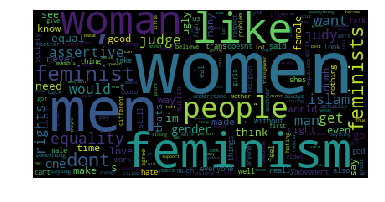

In [31]:
print('\n-------- Word cloud du lexique -------\n')
from wordcloud import WordCloud
import matplotlib.pyplot as plt
wordcloud = WordCloud().generate_from_frequencies(word_dist)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()


In [32]:
print('\n------- Detection de la langue -------\n')
'''from langdetect import detect

new_df['text'] = new_df['text'].astype(str)

new_df['lang'] = new_df['text'].map(lambda x: detect(x))'''
#pour homogeniser le corpus
from langdetect import detect

lang =[]   
for r in new_df.text:
    try:
        lang = detect(r)
        print (lang)
        new_df['Language text'] = lang
        print(new_df['Language text'])
    except:
        language = "error"
        print("Erreur")
        #xex=langdet.append(lang)
        


------- Detection de la langue -------

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20  

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
tr
0        tr
7        tr
8        tr
9        tr
10       tr
11       tr
12       tr
13       tr
14       tr
15       tr
16       tr
17       tr
18       tr
19       tr
20       tr
21       tr
22       tr
23       

da
0        da
7        da
8        da
9        da
10       da
11       da
12       da
13       da
14       da
15       da
16       da
17       da
18       da
19       da
20       da
21       da
22       da
23       da
24       da
25       da
26       da
27       da
28       da
29       da
30       da
32       da
33       da
35       da
38       da
39       da
         ..
14855    da
14856    da
14861    da
14873    da
14874    da
14875    da
14876    da
14880    da
14881    da
14896    da
14909    da
14911    da
14915    da
14918    da
14919    da
14920    da
14921    da
14922    da
14923    da
14925    da
14926    da
14946    da
14997    da
15024    da
15027    da
15029    da
15031    da
15056    da
15060    da
15062    da
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

pl
0        pl
7        pl
8        pl
9        pl
10       pl
11       pl
12       pl
13       pl
14       pl
15       pl
16       pl
17       pl
18       pl
19       pl
20       pl
21       pl
22       pl
23       pl
24       pl
25       pl
26       pl
27       pl
28       pl
29       pl
30       pl
32       pl
33       pl
35       pl
38       pl
39       pl
         ..
14855    pl
14856    pl
14861    pl
14873    pl
14874    pl
14875    pl
14876    pl
14880    pl
14881    pl
14896    pl
14909    pl
14911    pl
14915    pl
14918    pl
14919    pl
14920    pl
14921    pl
14922    pl
14923    pl
14925    pl
14926    pl
14946    pl
14997    pl
15024    pl
15027    pl
15029    pl
15031    pl
15056    pl
15060    pl
15062    pl
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        da
7        da
8        da
9        da
10       da
11       da
12       da
13       da
14       da
15       da
16       da
17       da
18       da
19       da
20       da
21       da
22       da
23       da
24       da
25       da
26       da
27       da
28       da
29       da
30       da
32       da
33       da
35       da
38       da
39       da
         ..
14855    da
14856    da
14861    da
14873    da
14874    da
14875    da
14876    da
14880    da
14881    da
14896    da
14909    da
14911    da
14915    da
14918    da
14919    da
14920    da
14921    da
14922    da
14923    da
14925    da
14926    da
14946    da
14997    da
15024    da
15027    da
15029    da
15031    da
15056    da
15060    da
15062    da
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
da
0        da
7        da
8        da
9        da
10       da
11       da
12       da
13       da
14       da
15       da
16       da
17       da
18       da
19       da
20       da
21       da
22       da
23       da


Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

cs
0        cs
7        cs
8        cs
9        cs
10       cs
11       cs
12       cs
13       cs
14       cs
15       cs
16       cs
17       cs
18       cs
19       cs
20       cs
21       cs
22       cs
23       cs
24       cs
25       cs
26       cs
27       cs
28       cs
29       cs
30       cs
32       cs
33       cs
35       cs
38       cs
39       cs
         ..
14855    cs
14856    cs
14861    cs
14873    cs
14874    cs
14875    cs
14876    cs
14880    cs
14881    cs
14896    cs
14909    cs
14911    cs
14915    cs
14918    cs
14919    cs
14920    cs
14921    cs
14922    cs
14923    cs
14925    cs
14926    cs
14946    cs
14997    cs
15024    cs
15027    cs
15029    cs
15031    cs
15056    cs
15060    cs
15062    cs
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
nl
0        nl
7        nl
8        nl
9        nl
10       nl
11       nl
12       nl
13       nl
14       nl
15       nl
16       nl
17       nl
18       nl
19       nl
20       nl
21       nl
22       nl
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

tl
0        tl
7        tl
8        tl
9        tl
10       tl
11       tl
12       tl
13       tl
14       tl
15       tl
16       tl
17       tl
18       tl
19       tl
20       tl
21       tl
22       tl
23       tl
24       tl
25       tl
26       tl
27       tl
28       tl
29       tl
30       tl
32       tl
33       tl
35       tl
38       tl
39       tl
         ..
14855    tl
14856    tl
14861    tl
14873    tl
14874    tl
14875    tl
14876    tl
14880    tl
14881    tl
14896    tl
14909    tl
14911    tl
14915    tl
14918    tl
14919    tl
14920    tl
14921    tl
14922    tl
14923    tl
14925    tl
14926    tl
14946    tl
14997    tl
15024    tl
15027    tl
15029    tl
15031    tl
15056    tl
15060    tl
15062    tl
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

Name: Language text, Length: 6589, dtype: object
af
0        af
7        af
8        af
9        af
10       af
11       af
12       af
13       af
14       af
15       af
16       af
17       af
18       af
19       af
20       af
21       af
22       af
23       af
24       af
25       af
26       af
27       af
28       af
29       af
30       af
32       af
33       af
35       af
38       af
39       af
         ..
14855    af
14856    af
14861    af
14873    af
14874    af
14875    af
14876    af
14880    af
14881    af
14896    af
14909    af
14911    af
14915    af
14918    af
14919    af
14920    af
14921    af
14922    af
14923    af
14925    af
14926    af
14946    af
14997    af
15024    af
15027    af
15029    af
15031    af
15056    af
15060    af
15062    af
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
af
0        af
7        af
8        af
9        af
10       af
11       af
12       af
13       af
14       af
15       af
16       af
17       af
18       af
19       af
20       af
21       af
22       af
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

hr
0        hr
7        hr
8        hr
9        hr
10       hr
11       hr
12       hr
13       hr
14       hr
15       hr
16       hr
17       hr
18       hr
19       hr
20       hr
21       hr
22       hr
23       hr
24       hr
25       hr
26       hr
27       hr
28       hr
29       hr
30       hr
32       hr
33       hr
35       hr
38       hr
39       hr
         ..
14855    hr
14856    hr
14861    hr
14873    hr
14874    hr
14875    hr
14876    hr
14880    hr
14881    hr
14896    hr
14909    hr
14911    hr
14915    hr
14918    hr
14919    hr
14920    hr
14921    hr
14922    hr
14923    hr
14925    hr
14926    hr
14946    hr
14997    hr
15024    hr
15027    hr
15029    hr
15031    hr
15056    hr
15060    hr
15062    hr
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
et
0        et
7        et
8        et
9        et
10       et
11       et
12       et
13       et
14       et
15       et
16       et
17       et
18       et
19       et
20       et
21       et
22       et
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
nl
0        nl
7        nl
8        nl
9        nl
10       nl
11       nl
12       nl
13       nl
14       nl
15       nl
16       nl
17       nl
18       nl
19       nl
20       nl
21       nl
22       nl
23       nl


0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

Name: Language text, Length: 6589, dtype: object
tl
0        tl
7        tl
8        tl
9        tl
10       tl
11       tl
12       tl
13       tl
14       tl
15       tl
16       tl
17       tl
18       tl
19       tl
20       tl
21       tl
22       tl
23       tl
24       tl
25       tl
26       tl
27       tl
28       tl
29       tl
30       tl
32       tl
33       tl
35       tl
38       tl
39       tl
         ..
14855    tl
14856    tl
14861    tl
14873    tl
14874    tl
14875    tl
14876    tl
14880    tl
14881    tl
14896    tl
14909    tl
14911    tl
14915    tl
14918    tl
14919    tl
14920    tl
14921    tl
14922    tl
14923    tl
14925    tl
14926    tl
14946    tl
14997    tl
15024    tl
15027    tl
15029    tl
15031    tl
15056    tl
15060    tl
15062    tl
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
so
0        so
7        so
8        so
9        so
10       so
11       so
12       so
13       so
14       so
15       so
16       so
17       so
18       so
19      

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
sk
0        sk
7        sk
8        sk
9        sk
10       sk
11       sk
12       sk
13       sk
14       sk
15       sk
16       sk
17       sk
18       sk
19       sk
20       sk
21       sk
22       sk
23       sk


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

it
0        it
7        it
8        it
9        it
10       it
11       it
12       it
13       it
14       it
15       it
16       it
17       it
18       it
19       it
20       it
21       it
22       it
23       it
24       it
25       it
26       it
27       it
28       it
29       it
30       it
32       it
33       it
35       it
38       it
39       it
         ..
14855    it
14856    it
14861    it
14873    it
14874    it
14875    it
14876    it
14880    it
14881    it
14896    it
14909    it
14911    it
14915    it
14918    it
14919    it
14920    it
14921    it
14922    it
14923    it
14925    it
14926    it
14946    it
14997    it
15024    it
15027    it
15029    it
15031    it
15056    it
15060    it
15062    it
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
so
0        so
7        so
8        so
9        so
10       so
11       so
12       so
13       so
14       so
15       so
16       so
17       so
18       so
19       so
20       so
21       so
22       so
23       so


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

Name: Language text, Length: 6589, dtype: object
ca
0        ca
7        ca
8        ca
9        ca
10       ca
11       ca
12       ca
13       ca
14       ca
15       ca
16       ca
17       ca
18       ca
19       ca
20       ca
21       ca
22       ca
23       ca
24       ca
25       ca
26       ca
27       ca
28       ca
29       ca
30       ca
32       ca
33       ca
35       ca
38       ca
39       ca
         ..
14855    ca
14856    ca
14861    ca
14873    ca
14874    ca
14875    ca
14876    ca
14880    ca
14881    ca
14896    ca
14909    ca
14911    ca
14915    ca
14918    ca
14919    ca
14920    ca
14921    ca
14922    ca
14923    ca
14925    ca
14926    ca
14946    ca
14997    ca
15024    ca
15027    ca
15029    ca
15031    ca
15056    ca
15060    ca
15062    ca
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

so
0        so
7        so
8        so
9        so
10       so
11       so
12       so
13       so
14       so
15       so
16       so
17       so
18       so
19       so
20       so
21       so
22       so
23       so
24       so
25       so
26       so
27       so
28       so
29       so
30       so
32       so
33       so
35       so
38       so
39       so
         ..
14855    so
14856    so
14861    so
14873    so
14874    so
14875    so
14876    so
14880    so
14881    so
14896    so
14909    so
14911    so
14915    so
14918    so
14919    so
14920    so
14921    so
14922    so
14923    so
14925    so
14926    so
14946    so
14997    so
15024    so
15027    so
15029    so
15031    so
15056    so
15060    so
15062    so
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


et
0        et
7        et
8        et
9        et
10       et
11       et
12       et
13       et
14       et
15       et
16       et
17       et
18       et
19       et
20       et
21       et
22       et
23       et
24       et
25       et
26       et
27       et
28       et
29       et
30       et
32       et
33       et
35       et
38       et
39       et
         ..
14855    et
14856    et
14861    et
14873    et
14874    et
14875    et
14876    et
14880    et
14881    et
14896    et
14909    et
14911    et
14915    et
14918    et
14919    et
14920    et
14921    et
14922    et
14923    et
14925    et
14926    et
14946    et
14997    et
15024    et
15027    et
15029    et
15031    et
15056    et
15060    et
15062    et
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

et
0        et
7        et
8        et
9        et
10       et
11       et
12       et
13       et
14       et
15       et
16       et
17       et
18       et
19       et
20       et
21       et
22       et
23       et
24       et
25       et
26       et
27       et
28       et
29       et
30       et
32       et
33       et
35       et
38       et
39       et
         ..
14855    et
14856    et
14861    et
14873    et
14874    et
14875    et
14876    et
14880    et
14881    et
14896    et
14909    et
14911    et
14915    et
14918    et
14919    et
14920    et
14921    et
14922    et
14923    et
14925    et
14926    et
14946    et
14997    et
15024    et
15027    et
15029    et
15031    et
15056    et
15060    et
15062    et
Name: Language text, Length: 6589, dtype: object
cy
0        cy
7        cy
8        cy
9        cy
10       cy
11       cy
12       cy
13       cy
14       cy
15       cy
16       cy
17       cy
18       cy
19       cy
20       cy
21       cy
22       cy
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

fi
0        fi
7        fi
8        fi
9        fi
10       fi
11       fi
12       fi
13       fi
14       fi
15       fi
16       fi
17       fi
18       fi
19       fi
20       fi
21       fi
22       fi
23       fi
24       fi
25       fi
26       fi
27       fi
28       fi
29       fi
30       fi
32       fi
33       fi
35       fi
38       fi
39       fi
         ..
14855    fi
14856    fi
14861    fi
14873    fi
14874    fi
14875    fi
14876    fi
14880    fi
14881    fi
14896    fi
14909    fi
14911    fi
14915    fi
14918    fi
14919    fi
14920    fi
14921    fi
14922    fi
14923    fi
14925    fi
14926    fi
14946    fi
14997    fi
15024    fi
15027    fi
15029    fi
15031    fi
15056    fi
15060    fi
15062    fi
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

da
0        da
7        da
8        da
9        da
10       da
11       da
12       da
13       da
14       da
15       da
16       da
17       da
18       da
19       da
20       da
21       da
22       da
23       da
24       da
25       da
26       da
27       da
28       da
29       da
30       da
32       da
33       da
35       da
38       da
39       da
         ..
14855    da
14856    da
14861    da
14873    da
14874    da
14875    da
14876    da
14880    da
14881    da
14896    da
14909    da
14911    da
14915    da
14918    da
14919    da
14920    da
14921    da
14922    da
14923    da
14925    da
14926    da
14946    da
14997    da
15024    da
15027    da
15029    da
15031    da
15056    da
15060    da
15062    da
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

fi
0        fi
7        fi
8        fi
9        fi
10       fi
11       fi
12       fi
13       fi
14       fi
15       fi
16       fi
17       fi
18       fi
19       fi
20       fi
21       fi
22       fi
23       fi
24       fi
25       fi
26       fi
27       fi
28       fi
29       fi
30       fi
32       fi
33       fi
35       fi
38       fi
39       fi
         ..
14855    fi
14856    fi
14861    fi
14873    fi
14874    fi
14875    fi
14876    fi
14880    fi
14881    fi
14896    fi
14909    fi
14911    fi
14915    fi
14918    fi
14919    fi
14920    fi
14921    fi
14922    fi
14923    fi
14925    fi
14926    fi
14946    fi
14997    fi
15024    fi
15027    fi
15029    fi
15031    fi
15056    fi
15060    fi
15062    fi
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


es
0        es
7        es
8        es
9        es
10       es
11       es
12       es
13       es
14       es
15       es
16       es
17       es
18       es
19       es
20       es
21       es
22       es
23       es
24       es
25       es
26       es
27       es
28       es
29       es
30       es
32       es
33       es
35       es
38       es
39       es
         ..
14855    es
14856    es
14861    es
14873    es
14874    es
14875    es
14876    es
14880    es
14881    es
14896    es
14909    es
14911    es
14915    es
14918    es
14919    es
14920    es
14921    es
14922    es
14923    es
14925    es
14926    es
14946    es
14997    es
15024    es
15027    es
15029    es
15031    es
15056    es
15060    es
15062    es
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
Erreur
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

da
0        da
7        da
8        da
9        da
10       da
11       da
12       da
13       da
14       da
15       da
16       da
17       da
18       da
19       da
20       da
21       da
22       da
23       da
24       da
25       da
26       da
27       da
28       da
29       da
30       da
32       da
33       da
35       da
38       da
39       da
         ..
14855    da
14856    da
14861    da
14873    da
14874    da
14875    da
14876    da
14880    da
14881    da
14896    da
14909    da
14911    da
14915    da
14918    da
14919    da
14920    da
14921    da
14922    da
14923    da
14925    da
14926    da
14946    da
14997    da
15024    da
15027    da
15029    da
15031    da
15056    da
15060    da
15062    da
Name: Language text, Length: 6589, dtype: object
hu
0        hu
7        hu
8        hu
9        hu
10       hu
11       hu
12       hu
13       hu
14       hu
15       hu
16       hu
17       hu
18       hu
19       hu
20       hu
21       hu
22       hu
23       

da
0        da
7        da
8        da
9        da
10       da
11       da
12       da
13       da
14       da
15       da
16       da
17       da
18       da
19       da
20       da
21       da
22       da
23       da
24       da
25       da
26       da
27       da
28       da
29       da
30       da
32       da
33       da
35       da
38       da
39       da
         ..
14855    da
14856    da
14861    da
14873    da
14874    da
14875    da
14876    da
14880    da
14881    da
14896    da
14909    da
14911    da
14915    da
14918    da
14919    da
14920    da
14921    da
14922    da
14923    da
14925    da
14926    da
14946    da
14997    da
15024    da
15027    da
15029    da
15031    da
15056    da
15060    da
15062    da
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
da
0        da
7        da
8        da
9        da
10       da
11       da
12       da
13       da
14       da
15       da
16       da
17       da
18       da
19      

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


Name: Language text, Length: 6589, dtype: object
ro
0        ro
7        ro
8        ro
9        ro
10       ro
11       ro
12       ro
13       ro
14       ro
15       ro
16       ro
17       ro
18       ro
19       ro
20       ro
21       ro
22       ro
23       ro
24       ro
25       ro
26       ro
27       ro
28       ro
29       ro
30       ro
32       ro
33       ro
35       ro
38       ro
39       ro
         ..
14855    ro
14856    ro
14861    ro
14873    ro
14874    ro
14875    ro
14876    ro
14880    ro
14881    ro
14896    ro
14909    ro
14911    ro
14915    ro
14918    ro
14919    ro
14920    ro
14921    ro
14922    ro
14923    ro
14925    ro
14926    ro
14946    ro
14997    ro
15024    ro
15027    ro
15029    ro
15031    ro
15056    ro
15060    ro
15062    ro
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

id
0        id
7        id
8        id
9        id
10       id
11       id
12       id
13       id
14       id
15       id
16       id
17       id
18       id
19       id
20       id
21       id
22       id
23       id
24       id
25       id
26       id
27       id
28       id
29       id
30       id
32       id
33       id
35       id
38       id
39       id
         ..
14855    id
14856    id
14861    id
14873    id
14874    id
14875    id
14876    id
14880    id
14881    id
14896    id
14909    id
14911    id
14915    id
14918    id
14919    id
14920    id
14921    id
14922    id
14923    id
14925    id
14926    id
14946    id
14997    id
15024    id
15027    id
15029    id
15031    id
15056    id
15060    id
15062    id
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

es
0        es
7        es
8        es
9        es
10       es
11       es
12       es
13       es
14       es
15       es
16       es
17       es
18       es
19       es
20       es
21       es
22       es
23       es
24       es
25       es
26       es
27       es
28       es
29       es
30       es
32       es
33       es
35       es
38       es
39       es
         ..
14855    es
14856    es
14861    es
14873    es
14874    es
14875    es
14876    es
14880    es
14881    es
14896    es
14909    es
14911    es
14915    es
14918    es
14919    es
14920    es
14921    es
14922    es
14923    es
14925    es
14926    es
14946    es
14997    es
15024    es
15027    es
15029    es
15031    es
15056    es
15060    es
15062    es
Name: Language text, Length: 6589, dtype: object
hu
0        hu
7        hu
8        hu
9        hu
10       hu
11       hu
12       hu
13       hu
14       hu
15       hu
16       hu
17       hu
18       hu
19       hu
20       hu
21       hu
22       hu
23       

da
0        da
7        da
8        da
9        da
10       da
11       da
12       da
13       da
14       da
15       da
16       da
17       da
18       da
19       da
20       da
21       da
22       da
23       da
24       da
25       da
26       da
27       da
28       da
29       da
30       da
32       da
33       da
35       da
38       da
39       da
         ..
14855    da
14856    da
14861    da
14873    da
14874    da
14875    da
14876    da
14880    da
14881    da
14896    da
14909    da
14911    da
14915    da
14918    da
14919    da
14920    da
14921    da
14922    da
14923    da
14925    da
14926    da
14946    da
14997    da
15024    da
15027    da
15029    da
15031    da
15056    da
15060    da
15062    da
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

hr
0        hr
7        hr
8        hr
9        hr
10       hr
11       hr
12       hr
13       hr
14       hr
15       hr
16       hr
17       hr
18       hr
19       hr
20       hr
21       hr
22       hr
23       hr
24       hr
25       hr
26       hr
27       hr
28       hr
29       hr
30       hr
32       hr
33       hr
35       hr
38       hr
39       hr
         ..
14855    hr
14856    hr
14861    hr
14873    hr
14874    hr
14875    hr
14876    hr
14880    hr
14881    hr
14896    hr
14909    hr
14911    hr
14915    hr
14918    hr
14919    hr
14920    hr
14921    hr
14922    hr
14923    hr
14925    hr
14926    hr
14946    hr
14997    hr
15024    hr
15027    hr
15029    hr
15031    hr
15056    hr
15060    hr
15062    hr
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

hr
0        hr
7        hr
8        hr
9        hr
10       hr
11       hr
12       hr
13       hr
14       hr
15       hr
16       hr
17       hr
18       hr
19       hr
20       hr
21       hr
22       hr
23       hr
24       hr
25       hr
26       hr
27       hr
28       hr
29       hr
30       hr
32       hr
33       hr
35       hr
38       hr
39       hr
         ..
14855    hr
14856    hr
14861    hr
14873    hr
14874    hr
14875    hr
14876    hr
14880    hr
14881    hr
14896    hr
14909    hr
14911    hr
14915    hr
14918    hr
14919    hr
14920    hr
14921    hr
14922    hr
14923    hr
14925    hr
14926    hr
14946    hr
14997    hr
15024    hr
15027    hr
15029    hr
15031    hr
15056    hr
15060    hr
15062    hr
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        da
7        da
8        da
9        da
10       da
11       da
12       da
13       da
14       da
15       da
16       da
17       da
18       da
19       da
20       da
21       da
22       da
23       da
24       da
25       da
26       da
27       da
28       da
29       da
30       da
32       da
33       da
35       da
38       da
39       da
         ..
14855    da
14856    da
14861    da
14873    da
14874    da
14875    da
14876    da
14880    da
14881    da
14896    da
14909    da
14911    da
14915    da
14918    da
14919    da
14920    da
14921    da
14922    da
14923    da
14925    da
14926    da
14946    da
14997    da
15024    da
15027    da
15029    da
15031    da
15056    da
15060    da
15062    da
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

hr
0        hr
7        hr
8        hr
9        hr
10       hr
11       hr
12       hr
13       hr
14       hr
15       hr
16       hr
17       hr
18       hr
19       hr
20       hr
21       hr
22       hr
23       hr
24       hr
25       hr
26       hr
27       hr
28       hr
29       hr
30       hr
32       hr
33       hr
35       hr
38       hr
39       hr
         ..
14855    hr
14856    hr
14861    hr
14873    hr
14874    hr
14875    hr
14876    hr
14880    hr
14881    hr
14896    hr
14909    hr
14911    hr
14915    hr
14918    hr
14919    hr
14920    hr
14921    hr
14922    hr
14923    hr
14925    hr
14926    hr
14946    hr
14997    hr
15024    hr
15027    hr
15029    hr
15031    hr
15056    hr
15060    hr
15062    hr
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

Name: Language text, Length: 6589, dtype: object
hr
0        hr
7        hr
8        hr
9        hr
10       hr
11       hr
12       hr
13       hr
14       hr
15       hr
16       hr
17       hr
18       hr
19       hr
20       hr
21       hr
22       hr
23       hr
24       hr
25       hr
26       hr
27       hr
28       hr
29       hr
30       hr
32       hr
33       hr
35       hr
38       hr
39       hr
         ..
14855    hr
14856    hr
14861    hr
14873    hr
14874    hr
14875    hr
14876    hr
14880    hr
14881    hr
14896    hr
14909    hr
14911    hr
14915    hr
14918    hr
14919    hr
14920    hr
14921    hr
14922    hr
14923    hr
14925    hr
14926    hr
14946    hr
14997    hr
15024    hr
15027    hr
15029    hr
15031    hr
15056    hr
15060    hr
15062    hr
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

hr
0        hr
7        hr
8        hr
9        hr
10       hr
11       hr
12       hr
13       hr
14       hr
15       hr
16       hr
17       hr
18       hr
19       hr
20       hr
21       hr
22       hr
23       hr
24       hr
25       hr
26       hr
27       hr
28       hr
29       hr
30       hr
32       hr
33       hr
35       hr
38       hr
39       hr
         ..
14855    hr
14856    hr
14861    hr
14873    hr
14874    hr
14875    hr
14876    hr
14880    hr
14881    hr
14896    hr
14909    hr
14911    hr
14915    hr
14918    hr
14919    hr
14920    hr
14921    hr
14922    hr
14923    hr
14925    hr
14926    hr
14946    hr
14997    hr
15024    hr
15027    hr
15029    hr
15031    hr
15056    hr
15060    hr
15062    hr
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

sk
0        sk
7        sk
8        sk
9        sk
10       sk
11       sk
12       sk
13       sk
14       sk
15       sk
16       sk
17       sk
18       sk
19       sk
20       sk
21       sk
22       sk
23       sk
24       sk
25       sk
26       sk
27       sk
28       sk
29       sk
30       sk
32       sk
33       sk
35       sk
38       sk
39       sk
         ..
14855    sk
14856    sk
14861    sk
14873    sk
14874    sk
14875    sk
14876    sk
14880    sk
14881    sk
14896    sk
14909    sk
14911    sk
14915    sk
14918    sk
14919    sk
14920    sk
14921    sk
14922    sk
14923    sk
14925    sk
14926    sk
14946    sk
14997    sk
15024    sk
15027    sk
15029    sk
15031    sk
15056    sk
15060    sk
15062    sk
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
ca
0        ca
7        ca
8        ca
9        ca
10       ca
11       ca
12       ca
13       ca
14       ca
15       ca
16       ca
17       ca
18       ca
19       ca
20       ca
21       ca
22       ca
23       ca


Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
no
0        no
7        no
8        no
9        no
10       no
11       no
12       no
13       no
14       no
15       no
16       no
17       no
18       no
19       no
20       no
21       no
22       no
23       no


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

cy
0        cy
7        cy
8        cy
9        cy
10       cy
11       cy
12       cy
13       cy
14       cy
15       cy
16       cy
17       cy
18       cy
19       cy
20       cy
21       cy
22       cy
23       cy
24       cy
25       cy
26       cy
27       cy
28       cy
29       cy
30       cy
32       cy
33       cy
35       cy
38       cy
39       cy
         ..
14855    cy
14856    cy
14861    cy
14873    cy
14874    cy
14875    cy
14876    cy
14880    cy
14881    cy
14896    cy
14909    cy
14911    cy
14915    cy
14918    cy
14919    cy
14920    cy
14921    cy
14922    cy
14923    cy
14925    cy
14926    cy
14946    cy
14997    cy
15024    cy
15027    cy
15029    cy
15031    cy
15056    cy
15060    cy
15062    cy
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
pl
0        pl
7        pl
8        pl
9        pl
10       pl
11       pl
12       pl
13       pl
14       pl
15       pl
16       pl
17       pl
18       pl
19       pl
20       pl
21       pl
22       pl
23       pl


no
0        no
7        no
8        no
9        no
10       no
11       no
12       no
13       no
14       no
15       no
16       no
17       no
18       no
19       no
20       no
21       no
22       no
23       no
24       no
25       no
26       no
27       no
28       no
29       no
30       no
32       no
33       no
35       no
38       no
39       no
         ..
14855    no
14856    no
14861    no
14873    no
14874    no
14875    no
14876    no
14880    no
14881    no
14896    no
14909    no
14911    no
14915    no
14918    no
14919    no
14920    no
14921    no
14922    no
14923    no
14925    no
14926    no
14946    no
14997    no
15024    no
15027    no
15029    no
15031    no
15056    no
15060    no
15062    no
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

et
0        et
7        et
8        et
9        et
10       et
11       et
12       et
13       et
14       et
15       et
16       et
17       et
18       et
19       et
20       et
21       et
22       et
23       et
24       et
25       et
26       et
27       et
28       et
29       et
30       et
32       et
33       et
35       et
38       et
39       et
         ..
14855    et
14856    et
14861    et
14873    et
14874    et
14875    et
14876    et
14880    et
14881    et
14896    et
14909    et
14911    et
14915    et
14918    et
14919    et
14920    et
14921    et
14922    et
14923    et
14925    et
14926    et
14946    et
14997    et
15024    et
15027    et
15029    et
15031    et
15056    et
15060    et
15062    et
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

Name: Language text, Length: 6589, dtype: object
fr
0        fr
7        fr
8        fr
9        fr
10       fr
11       fr
12       fr
13       fr
14       fr
15       fr
16       fr
17       fr
18       fr
19       fr
20       fr
21       fr
22       fr
23       fr
24       fr
25       fr
26       fr
27       fr
28       fr
29       fr
30       fr
32       fr
33       fr
35       fr
38       fr
39       fr
         ..
14855    fr
14856    fr
14861    fr
14873    fr
14874    fr
14875    fr
14876    fr
14880    fr
14881    fr
14896    fr
14909    fr
14911    fr
14915    fr
14918    fr
14919    fr
14920    fr
14921    fr
14922    fr
14923    fr
14925    fr
14926    fr
14946    fr
14997    fr
15024    fr
15027    fr
15029    fr
15031    fr
15056    fr
15060    fr
15062    fr
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
hu
0        hu
7        hu
8        hu
9        hu
10       hu
11       hu
12       hu
13       hu
14       hu
15       hu
16       hu
17       hu
18       hu
19       hu
20       hu
21       hu
22       hu
23       hu


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


cy
0        cy
7        cy
8        cy
9        cy
10       cy
11       cy
12       cy
13       cy
14       cy
15       cy
16       cy
17       cy
18       cy
19       cy
20       cy
21       cy
22       cy
23       cy
24       cy
25       cy
26       cy
27       cy
28       cy
29       cy
30       cy
32       cy
33       cy
35       cy
38       cy
39       cy
         ..
14855    cy
14856    cy
14861    cy
14873    cy
14874    cy
14875    cy
14876    cy
14880    cy
14881    cy
14896    cy
14909    cy
14911    cy
14915    cy
14918    cy
14919    cy
14920    cy
14921    cy
14922    cy
14923    cy
14925    cy
14926    cy
14946    cy
14997    cy
15024    cy
15027    cy
15029    cy
15031    cy
15056    cy
15060    cy
15062    cy
Name: Language text, Length: 6589, dtype: object
da
0        da
7        da
8        da
9        da
10       da
11       da
12       da
13       da
14       da
15       da
16       da
17       da
18       da
19       da
20       da
21       da
22       da
23       

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

ro
0        ro
7        ro
8        ro
9        ro
10       ro
11       ro
12       ro
13       ro
14       ro
15       ro
16       ro
17       ro
18       ro
19       ro
20       ro
21       ro
22       ro
23       ro
24       ro
25       ro
26       ro
27       ro
28       ro
29       ro
30       ro
32       ro
33       ro
35       ro
38       ro
39       ro
         ..
14855    ro
14856    ro
14861    ro
14873    ro
14874    ro
14875    ro
14876    ro
14880    ro
14881    ro
14896    ro
14909    ro
14911    ro
14915    ro
14918    ro
14919    ro
14920    ro
14921    ro
14922    ro
14923    ro
14925    ro
14926    ro
14946    ro
14997    ro
15024    ro
15027    ro
15029    ro
15031    ro
15056    ro
15060    ro
15062    ro
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
fr
0        fr
7        fr
8        fr
9        fr
10       fr
11       fr
12       fr
13       fr
14       fr
15       fr
16       fr
17       fr
18       fr
19       fr
20       fr
21       fr
22       fr
23       fr


no
0        no
7        no
8        no
9        no
10       no
11       no
12       no
13       no
14       no
15       no
16       no
17       no
18       no
19       no
20       no
21       no
22       no
23       no
24       no
25       no
26       no
27       no
28       no
29       no
30       no
32       no
33       no
35       no
38       no
39       no
         ..
14855    no
14856    no
14861    no
14873    no
14874    no
14875    no
14876    no
14880    no
14881    no
14896    no
14909    no
14911    no
14915    no
14918    no
14919    no
14920    no
14921    no
14922    no
14923    no
14925    no
14926    no
14946    no
14997    no
15024    no
15027    no
15029    no
15031    no
15056    no
15060    no
15062    no
Name: Language text, Length: 6589, dtype: object
it
0        it
7        it
8        it
9        it
10       it
11       it
12       it
13       it
14       it
15       it
16       it
17       it
18       it
19       it
20       it
21       it
22       it
23       

fi
0        fi
7        fi
8        fi
9        fi
10       fi
11       fi
12       fi
13       fi
14       fi
15       fi
16       fi
17       fi
18       fi
19       fi
20       fi
21       fi
22       fi
23       fi
24       fi
25       fi
26       fi
27       fi
28       fi
29       fi
30       fi
32       fi
33       fi
35       fi
38       fi
39       fi
         ..
14855    fi
14856    fi
14861    fi
14873    fi
14874    fi
14875    fi
14876    fi
14880    fi
14881    fi
14896    fi
14909    fi
14911    fi
14915    fi
14918    fi
14919    fi
14920    fi
14921    fi
14922    fi
14923    fi
14925    fi
14926    fi
14946    fi
14997    fi
15024    fi
15027    fi
15029    fi
15031    fi
15056    fi
15060    fi
15062    fi
Name: Language text, Length: 6589, dtype: object
Erreur
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

tl
0        tl
7        tl
8        tl
9        tl
10       tl
11       tl
12       tl
13       tl
14       tl
15       tl
16       tl
17       tl
18       tl
19       tl
20       tl
21       tl
22       tl
23       tl
24       tl
25       tl
26       tl
27       tl
28       tl
29       tl
30       tl
32       tl
33       tl
35       tl
38       tl
39       tl
         ..
14855    tl
14856    tl
14861    tl
14873    tl
14874    tl
14875    tl
14876    tl
14880    tl
14881    tl
14896    tl
14909    tl
14911    tl
14915    tl
14918    tl
14919    tl
14920    tl
14921    tl
14922    tl
14923    tl
14925    tl
14926    tl
14946    tl
14997    tl
15024    tl
15027    tl
15029    tl
15031    tl
15056    tl
15060    tl
15062    tl
Name: Language text, Length: 6589, dtype: object
no
0        no
7        no
8        no
9        no
10       no
11       no
12       no
13       no
14       no
15       no
16       no
17       no
18       no
19       no
20       no
21       no
22       no
23       

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

fr
0        fr
7        fr
8        fr
9        fr
10       fr
11       fr
12       fr
13       fr
14       fr
15       fr
16       fr
17       fr
18       fr
19       fr
20       fr
21       fr
22       fr
23       fr
24       fr
25       fr
26       fr
27       fr
28       fr
29       fr
30       fr
32       fr
33       fr
35       fr
38       fr
39       fr
         ..
14855    fr
14856    fr
14861    fr
14873    fr
14874    fr
14875    fr
14876    fr
14880    fr
14881    fr
14896    fr
14909    fr
14911    fr
14915    fr
14918    fr
14919    fr
14920    fr
14921    fr
14922    fr
14923    fr
14925    fr
14926    fr
14946    fr
14997    fr
15024    fr
15027    fr
15029    fr
15031    fr
15056    fr
15060    fr
15062    fr
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

fr
0        fr
7        fr
8        fr
9        fr
10       fr
11       fr
12       fr
13       fr
14       fr
15       fr
16       fr
17       fr
18       fr
19       fr
20       fr
21       fr
22       fr
23       fr
24       fr
25       fr
26       fr
27       fr
28       fr
29       fr
30       fr
32       fr
33       fr
35       fr
38       fr
39       fr
         ..
14855    fr
14856    fr
14861    fr
14873    fr
14874    fr
14875    fr
14876    fr
14880    fr
14881    fr
14896    fr
14909    fr
14911    fr
14915    fr
14918    fr
14919    fr
14920    fr
14921    fr
14922    fr
14923    fr
14925    fr
14926    fr
14946    fr
14997    fr
15024    fr
15027    fr
15029    fr
15031    fr
15056    fr
15060    fr
15062    fr
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


Name: Language text, Length: 6589, dtype: object
lt
0        lt
7        lt
8        lt
9        lt
10       lt
11       lt
12       lt
13       lt
14       lt
15       lt
16       lt
17       lt
18       lt
19       lt
20       lt
21       lt
22       lt
23       lt
24       lt
25       lt
26       lt
27       lt
28       lt
29       lt
30       lt
32       lt
33       lt
35       lt
38       lt
39       lt
         ..
14855    lt
14856    lt
14861    lt
14873    lt
14874    lt
14875    lt
14876    lt
14880    lt
14881    lt
14896    lt
14909    lt
14911    lt
14915    lt
14918    lt
14919    lt
14920    lt
14921    lt
14922    lt
14923    lt
14925    lt
14926    lt
14946    lt
14997    lt
15024    lt
15027    lt
15029    lt
15031    lt
15056    lt
15060    lt
15062    lt
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
tl
0        tl
7        tl
8        tl
9        tl
10       tl
11       tl
12       tl
13       tl
14       tl
15       tl
16       tl
17       tl
18       tl
19       tl
20       tl
21       tl
22       tl
23       tl


ca
0        ca
7        ca
8        ca
9        ca
10       ca
11       ca
12       ca
13       ca
14       ca
15       ca
16       ca
17       ca
18       ca
19       ca
20       ca
21       ca
22       ca
23       ca
24       ca
25       ca
26       ca
27       ca
28       ca
29       ca
30       ca
32       ca
33       ca
35       ca
38       ca
39       ca
         ..
14855    ca
14856    ca
14861    ca
14873    ca
14874    ca
14875    ca
14876    ca
14880    ca
14881    ca
14896    ca
14909    ca
14911    ca
14915    ca
14918    ca
14919    ca
14920    ca
14921    ca
14922    ca
14923    ca
14925    ca
14926    ca
14946    ca
14997    ca
15024    ca
15027    ca
15029    ca
15031    ca
15056    ca
15060    ca
15062    ca
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
tl
0        tl
7        tl
8        tl
9        tl
10       tl
11       tl
12       tl
13       tl
14       tl
15       tl
16       tl
17       tl
18       tl
19       tl
20       tl
21       tl
22       tl
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

da
0        da
7        da
8        da
9        da
10       da
11       da
12       da
13       da
14       da
15       da
16       da
17       da
18       da
19       da
20       da
21       da
22       da
23       da
24       da
25       da
26       da
27       da
28       da
29       da
30       da
32       da
33       da
35       da
38       da
39       da
         ..
14855    da
14856    da
14861    da
14873    da
14874    da
14875    da
14876    da
14880    da
14881    da
14896    da
14909    da
14911    da
14915    da
14918    da
14919    da
14920    da
14921    da
14922    da
14923    da
14925    da
14926    da
14946    da
14997    da
15024    da
15027    da
15029    da
15031    da
15056    da
15060    da
15062    da
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
no
0        no
7        no
8        no
9        no
10       no
11       no
12       no
13       no
14       no
15       no
16       no
17       no
18       no
19       no
20       no
21       no
22       no
23       no


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

ro
0        ro
7        ro
8        ro
9        ro
10       ro
11       ro
12       ro
13       ro
14       ro
15       ro
16       ro
17       ro
18       ro
19       ro
20       ro
21       ro
22       ro
23       ro
24       ro
25       ro
26       ro
27       ro
28       ro
29       ro
30       ro
32       ro
33       ro
35       ro
38       ro
39       ro
         ..
14855    ro
14856    ro
14861    ro
14873    ro
14874    ro
14875    ro
14876    ro
14880    ro
14881    ro
14896    ro
14909    ro
14911    ro
14915    ro
14918    ro
14919    ro
14920    ro
14921    ro
14922    ro
14923    ro
14925    ro
14926    ro
14946    ro
14997    ro
15024    ro
15027    ro
15029    ro
15031    ro
15056    ro
15060    ro
15062    ro
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

Name: Language text, Length: 6589, dtype: object
tl
0        tl
7        tl
8        tl
9        tl
10       tl
11       tl
12       tl
13       tl
14       tl
15       tl
16       tl
17       tl
18       tl
19       tl
20       tl
21       tl
22       tl
23       tl
24       tl
25       tl
26       tl
27       tl
28       tl
29       tl
30       tl
32       tl
33       tl
35       tl
38       tl
39       tl
         ..
14855    tl
14856    tl
14861    tl
14873    tl
14874    tl
14875    tl
14876    tl
14880    tl
14881    tl
14896    tl
14909    tl
14911    tl
14915    tl
14918    tl
14919    tl
14920    tl
14921    tl
14922    tl
14923    tl
14925    tl
14926    tl
14946    tl
14997    tl
15024    tl
15027    tl
15029    tl
15031    tl
15056    tl
15060    tl
15062    tl
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

hu
0        hu
7        hu
8        hu
9        hu
10       hu
11       hu
12       hu
13       hu
14       hu
15       hu
16       hu
17       hu
18       hu
19       hu
20       hu
21       hu
22       hu
23       hu
24       hu
25       hu
26       hu
27       hu
28       hu
29       hu
30       hu
32       hu
33       hu
35       hu
38       hu
39       hu
         ..
14855    hu
14856    hu
14861    hu
14873    hu
14874    hu
14875    hu
14876    hu
14880    hu
14881    hu
14896    hu
14909    hu
14911    hu
14915    hu
14918    hu
14919    hu
14920    hu
14921    hu
14922    hu
14923    hu
14925    hu
14926    hu
14946    hu
14997    hu
15024    hu
15027    hu
15029    hu
15031    hu
15056    hu
15060    hu
15062    hu
Name: Language text, Length: 6589, dtype: object
no
0        no
7        no
8        no
9        no
10       no
11       no
12       no
13       no
14       no
15       no
16       no
17       no
18       no
19       no
20       no
21       no
22       no
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

da
0        da
7        da
8        da
9        da
10       da
11       da
12       da
13       da
14       da
15       da
16       da
17       da
18       da
19       da
20       da
21       da
22       da
23       da
24       da
25       da
26       da
27       da
28       da
29       da
30       da
32       da
33       da
35       da
38       da
39       da
         ..
14855    da
14856    da
14861    da
14873    da
14874    da
14875    da
14876    da
14880    da
14881    da
14896    da
14909    da
14911    da
14915    da
14918    da
14919    da
14920    da
14921    da
14922    da
14923    da
14925    da
14926    da
14946    da
14997    da
15024    da
15027    da
15029    da
15031    da
15056    da
15060    da
15062    da
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

tl
0        tl
7        tl
8        tl
9        tl
10       tl
11       tl
12       tl
13       tl
14       tl
15       tl
16       tl
17       tl
18       tl
19       tl
20       tl
21       tl
22       tl
23       tl
24       tl
25       tl
26       tl
27       tl
28       tl
29       tl
30       tl
32       tl
33       tl
35       tl
38       tl
39       tl
         ..
14855    tl
14856    tl
14861    tl
14873    tl
14874    tl
14875    tl
14876    tl
14880    tl
14881    tl
14896    tl
14909    tl
14911    tl
14915    tl
14918    tl
14919    tl
14920    tl
14921    tl
14922    tl
14923    tl
14925    tl
14926    tl
14946    tl
14997    tl
15024    tl
15027    tl
15029    tl
15031    tl
15056    tl
15060    tl
15062    tl
Name: Language text, Length: 6589, dtype: object
sq
0        sq
7        sq
8        sq
9        sq
10       sq
11       sq
12       sq
13       sq
14       sq
15       sq
16       sq
17       sq
18       sq
19       sq
20       sq
21       sq
22       sq
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


tl
0        tl
7        tl
8        tl
9        tl
10       tl
11       tl
12       tl
13       tl
14       tl
15       tl
16       tl
17       tl
18       tl
19       tl
20       tl
21       tl
22       tl
23       tl
24       tl
25       tl
26       tl
27       tl
28       tl
29       tl
30       tl
32       tl
33       tl
35       tl
38       tl
39       tl
         ..
14855    tl
14856    tl
14861    tl
14873    tl
14874    tl
14875    tl
14876    tl
14880    tl
14881    tl
14896    tl
14909    tl
14911    tl
14915    tl
14918    tl
14919    tl
14920    tl
14921    tl
14922    tl
14923    tl
14925    tl
14926    tl
14946    tl
14997    tl
15024    tl
15027    tl
15029    tl
15031    tl
15056    tl
15060    tl
15062    tl
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
tr
0        tr
7        tr
8        tr
9        tr
10       tr
11       tr
12       tr
13       tr
14       tr
15       tr
16       tr
17       tr
18       tr
19       tr
20       tr
21       tr
22       tr
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

af
0        af
7        af
8        af
9        af
10       af
11       af
12       af
13       af
14       af
15       af
16       af
17       af
18       af
19       af
20       af
21       af
22       af
23       af
24       af
25       af
26       af
27       af
28       af
29       af
30       af
32       af
33       af
35       af
38       af
39       af
         ..
14855    af
14856    af
14861    af
14873    af
14874    af
14875    af
14876    af
14880    af
14881    af
14896    af
14909    af
14911    af
14915    af
14918    af
14919    af
14920    af
14921    af
14922    af
14923    af
14925    af
14926    af
14946    af
14997    af
15024    af
15027    af
15029    af
15031    af
15056    af
15060    af
15062    af
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


sq
0        sq
7        sq
8        sq
9        sq
10       sq
11       sq
12       sq
13       sq
14       sq
15       sq
16       sq
17       sq
18       sq
19       sq
20       sq
21       sq
22       sq
23       sq
24       sq
25       sq
26       sq
27       sq
28       sq
29       sq
30       sq
32       sq
33       sq
35       sq
38       sq
39       sq
         ..
14855    sq
14856    sq
14861    sq
14873    sq
14874    sq
14875    sq
14876    sq
14880    sq
14881    sq
14896    sq
14909    sq
14911    sq
14915    sq
14918    sq
14919    sq
14920    sq
14921    sq
14922    sq
14923    sq
14925    sq
14926    sq
14946    sq
14997    sq
15024    sq
15027    sq
15029    sq
15031    sq
15056    sq
15060    sq
15062    sq
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
fi
0        fi
7        fi
8        fi
9        fi
10       fi
11       fi
12       fi
13       fi
14       fi
15       fi
16       fi
17       fi
18       fi
19       fi
20       fi
21       fi
22       fi
23       

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
fr
0        fr
7        fr
8        fr
9        fr
10       fr
11       fr
12       fr
13       fr
14       fr
15       fr
16       fr
17       fr
18       fr
19      

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

0        hr
7        hr
8        hr
9        hr
10       hr
11       hr
12       hr
13       hr
14       hr
15       hr
16       hr
17       hr
18       hr
19       hr
20       hr
21       hr
22       hr
23       hr
24       hr
25       hr
26       hr
27       hr
28       hr
29       hr
30       hr
32       hr
33       hr
35       hr
38       hr
39       hr
         ..
14855    hr
14856    hr
14861    hr
14873    hr
14874    hr
14875    hr
14876    hr
14880    hr
14881    hr
14896    hr
14909    hr
14911    hr
14915    hr
14918    hr
14919    hr
14920    hr
14921    hr
14922    hr
14923    hr
14925    hr
14926    hr
14946    hr
14997    hr
15024    hr
15027    hr
15029    hr
15031    hr
15056    hr
15060    hr
15062    hr
Name: Language text, Length: 6589, dtype: object
nl
0        nl
7        nl
8        nl
9        nl
10       nl
11       nl
12       nl
13       nl
14       nl
15       nl
16       nl
17       nl
18       nl
19       nl
20       nl
21       nl
22       nl
23       nl


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


es
0        es
7        es
8        es
9        es
10       es
11       es
12       es
13       es
14       es
15       es
16       es
17       es
18       es
19       es
20       es
21       es
22       es
23       es
24       es
25       es
26       es
27       es
28       es
29       es
30       es
32       es
33       es
35       es
38       es
39       es
         ..
14855    es
14856    es
14861    es
14873    es
14874    es
14875    es
14876    es
14880    es
14881    es
14896    es
14909    es
14911    es
14915    es
14918    es
14919    es
14920    es
14921    es
14922    es
14923    es
14925    es
14926    es
14946    es
14997    es
15024    es
15027    es
15029    es
15031    es
15056    es
15060    es
15062    es
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

af
0        af
7        af
8        af
9        af
10       af
11       af
12       af
13       af
14       af
15       af
16       af
17       af
18       af
19       af
20       af
21       af
22       af
23       af
24       af
25       af
26       af
27       af
28       af
29       af
30       af
32       af
33       af
35       af
38       af
39       af
         ..
14855    af
14856    af
14861    af
14873    af
14874    af
14875    af
14876    af
14880    af
14881    af
14896    af
14909    af
14911    af
14915    af
14918    af
14919    af
14920    af
14921    af
14922    af
14923    af
14925    af
14926    af
14946    af
14997    af
15024    af
15027    af
15029    af
15031    af
15056    af
15060    af
15062    af
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        sk
7        sk
8        sk
9        sk
10       sk
11       sk
12       sk
13       sk
14       sk
15       sk
16       sk
17       sk
18       sk
19       sk
20       sk
21       sk
22       sk
23       sk
24       sk
25       sk
26       sk
27       sk
28       sk
29       sk
30       sk
32       sk
33       sk
35       sk
38       sk
39       sk
         ..
14855    sk
14856    sk
14861    sk
14873    sk
14874    sk
14875    sk
14876    sk
14880    sk
14881    sk
14896    sk
14909    sk
14911    sk
14915    sk
14918    sk
14919    sk
14920    sk
14921    sk
14922    sk
14923    sk
14925    sk
14926    sk
14946    sk
14997    sk
15024    sk
15027    sk
15029    sk
15031    sk
15056    sk
15060    sk
15062    sk
Name: Language text, Length: 6589, dtype: object
ro
0        ro
7        ro
8        ro
9        ro
10       ro
11       ro
12       ro
13       ro
14       ro
15       ro
16       ro
17       ro
18       ro
19       ro
20       ro
21       ro
22       ro
23       ro


0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

tl
0        tl
7        tl
8        tl
9        tl
10       tl
11       tl
12       tl
13       tl
14       tl
15       tl
16       tl
17       tl
18       tl
19       tl
20       tl
21       tl
22       tl
23       tl
24       tl
25       tl
26       tl
27       tl
28       tl
29       tl
30       tl
32       tl
33       tl
35       tl
38       tl
39       tl
         ..
14855    tl
14856    tl
14861    tl
14873    tl
14874    tl
14875    tl
14876    tl
14880    tl
14881    tl
14896    tl
14909    tl
14911    tl
14915    tl
14918    tl
14919    tl
14920    tl
14921    tl
14922    tl
14923    tl
14925    tl
14926    tl
14946    tl
14997    tl
15024    tl
15027    tl
15029    tl
15031    tl
15056    tl
15060    tl
15062    tl
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

no
0        no
7        no
8        no
9        no
10       no
11       no
12       no
13       no
14       no
15       no
16       no
17       no
18       no
19       no
20       no
21       no
22       no
23       no
24       no
25       no
26       no
27       no
28       no
29       no
30       no
32       no
33       no
35       no
38       no
39       no
         ..
14855    no
14856    no
14861    no
14873    no
14874    no
14875    no
14876    no
14880    no
14881    no
14896    no
14909    no
14911    no
14915    no
14918    no
14919    no
14920    no
14921    no
14922    no
14923    no
14925    no
14926    no
14946    no
14997    no
15024    no
15027    no
15029    no
15031    no
15056    no
15060    no
15062    no
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

it
0        it
7        it
8        it
9        it
10       it
11       it
12       it
13       it
14       it
15       it
16       it
17       it
18       it
19       it
20       it
21       it
22       it
23       it
24       it
25       it
26       it
27       it
28       it
29       it
30       it
32       it
33       it
35       it
38       it
39       it
         ..
14855    it
14856    it
14861    it
14873    it
14874    it
14875    it
14876    it
14880    it
14881    it
14896    it
14909    it
14911    it
14915    it
14918    it
14919    it
14920    it
14921    it
14922    it
14923    it
14925    it
14926    it
14946    it
14997    it
15024    it
15027    it
15029    it
15031    it
15056    it
15060    it
15062    it
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

ro
0        ro
7        ro
8        ro
9        ro
10       ro
11       ro
12       ro
13       ro
14       ro
15       ro
16       ro
17       ro
18       ro
19       ro
20       ro
21       ro
22       ro
23       ro
24       ro
25       ro
26       ro
27       ro
28       ro
29       ro
30       ro
32       ro
33       ro
35       ro
38       ro
39       ro
         ..
14855    ro
14856    ro
14861    ro
14873    ro
14874    ro
14875    ro
14876    ro
14880    ro
14881    ro
14896    ro
14909    ro
14911    ro
14915    ro
14918    ro
14919    ro
14920    ro
14921    ro
14922    ro
14923    ro
14925    ro
14926    ro
14946    ro
14997    ro
15024    ro
15027    ro
15029    ro
15031    ro
15056    ro
15060    ro
15062    ro
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
cy
0        cy
7        cy
8        cy
9        cy
10       cy
11       cy
12       cy
13       cy
14       cy
15       cy
16       cy
17       cy
18       cy
19       cy
20       cy
21       cy
22       cy
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
it
0        it
7        it
8        it
9        it
10       it
11       it
12       it
13       it
14       it
15       it
16       it
17       it
18       it
19       it
20       it
21       it
22       it
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

sv
0        sv
7        sv
8        sv
9        sv
10       sv
11       sv
12       sv
13       sv
14       sv
15       sv
16       sv
17       sv
18       sv
19       sv
20       sv
21       sv
22       sv
23       sv
24       sv
25       sv
26       sv
27       sv
28       sv
29       sv
30       sv
32       sv
33       sv
35       sv
38       sv
39       sv
         ..
14855    sv
14856    sv
14861    sv
14873    sv
14874    sv
14875    sv
14876    sv
14880    sv
14881    sv
14896    sv
14909    sv
14911    sv
14915    sv
14918    sv
14919    sv
14920    sv
14921    sv
14922    sv
14923    sv
14925    sv
14926    sv
14946    sv
14997    sv
15024    sv
15027    sv
15029    sv
15031    sv
15056    sv
15060    sv
15062    sv
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

ro
0        ro
7        ro
8        ro
9        ro
10       ro
11       ro
12       ro
13       ro
14       ro
15       ro
16       ro
17       ro
18       ro
19       ro
20       ro
21       ro
22       ro
23       ro
24       ro
25       ro
26       ro
27       ro
28       ro
29       ro
30       ro
32       ro
33       ro
35       ro
38       ro
39       ro
         ..
14855    ro
14856    ro
14861    ro
14873    ro
14874    ro
14875    ro
14876    ro
14880    ro
14881    ro
14896    ro
14909    ro
14911    ro
14915    ro
14918    ro
14919    ro
14920    ro
14921    ro
14922    ro
14923    ro
14925    ro
14926    ro
14946    ro
14997    ro
15024    ro
15027    ro
15029    ro
15031    ro
15056    ro
15060    ro
15062    ro
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

Name: Language text, Length: 6589, dtype: object
nl
0        nl
7        nl
8        nl
9        nl
10       nl
11       nl
12       nl
13       nl
14       nl
15       nl
16       nl
17       nl
18       nl
19       nl
20       nl
21       nl
22       nl
23       nl
24       nl
25       nl
26       nl
27       nl
28       nl
29       nl
30       nl
32       nl
33       nl
35       nl
38       nl
39       nl
         ..
14855    nl
14856    nl
14861    nl
14873    nl
14874    nl
14875    nl
14876    nl
14880    nl
14881    nl
14896    nl
14909    nl
14911    nl
14915    nl
14918    nl
14919    nl
14920    nl
14921    nl
14922    nl
14923    nl
14925    nl
14926    nl
14946    nl
14997    nl
15024    nl
15027    nl
15029    nl
15031    nl
15056    nl
15060    nl
15062    nl
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

ca
0        ca
7        ca
8        ca
9        ca
10       ca
11       ca
12       ca
13       ca
14       ca
15       ca
16       ca
17       ca
18       ca
19       ca
20       ca
21       ca
22       ca
23       ca
24       ca
25       ca
26       ca
27       ca
28       ca
29       ca
30       ca
32       ca
33       ca
35       ca
38       ca
39       ca
         ..
14855    ca
14856    ca
14861    ca
14873    ca
14874    ca
14875    ca
14876    ca
14880    ca
14881    ca
14896    ca
14909    ca
14911    ca
14915    ca
14918    ca
14919    ca
14920    ca
14921    ca
14922    ca
14923    ca
14925    ca
14926    ca
14946    ca
14997    ca
15024    ca
15027    ca
15029    ca
15031    ca
15056    ca
15060    ca
15062    ca
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

it
0        it
7        it
8        it
9        it
10       it
11       it
12       it
13       it
14       it
15       it
16       it
17       it
18       it
19       it
20       it
21       it
22       it
23       it
24       it
25       it
26       it
27       it
28       it
29       it
30       it
32       it
33       it
35       it
38       it
39       it
         ..
14855    it
14856    it
14861    it
14873    it
14874    it
14875    it
14876    it
14880    it
14881    it
14896    it
14909    it
14911    it
14915    it
14918    it
14919    it
14920    it
14921    it
14922    it
14923    it
14925    it
14926    it
14946    it
14997    it
15024    it
15027    it
15029    it
15031    it
15056    it
15060    it
15062    it
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

af
0        af
7        af
8        af
9        af
10       af
11       af
12       af
13       af
14       af
15       af
16       af
17       af
18       af
19       af
20       af
21       af
22       af
23       af
24       af
25       af
26       af
27       af
28       af
29       af
30       af
32       af
33       af
35       af
38       af
39       af
         ..
14855    af
14856    af
14861    af
14873    af
14874    af
14875    af
14876    af
14880    af
14881    af
14896    af
14909    af
14911    af
14915    af
14918    af
14919    af
14920    af
14921    af
14922    af
14923    af
14925    af
14926    af
14946    af
14997    af
15024    af
15027    af
15029    af
15031    af
15056    af
15060    af
15062    af
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


sv
0        sv
7        sv
8        sv
9        sv
10       sv
11       sv
12       sv
13       sv
14       sv
15       sv
16       sv
17       sv
18       sv
19       sv
20       sv
21       sv
22       sv
23       sv
24       sv
25       sv
26       sv
27       sv
28       sv
29       sv
30       sv
32       sv
33       sv
35       sv
38       sv
39       sv
         ..
14855    sv
14856    sv
14861    sv
14873    sv
14874    sv
14875    sv
14876    sv
14880    sv
14881    sv
14896    sv
14909    sv
14911    sv
14915    sv
14918    sv
14919    sv
14920    sv
14921    sv
14922    sv
14923    sv
14925    sv
14926    sv
14946    sv
14997    sv
15024    sv
15027    sv
15029    sv
15031    sv
15056    sv
15060    sv
15062    sv
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

ca
0        ca
7        ca
8        ca
9        ca
10       ca
11       ca
12       ca
13       ca
14       ca
15       ca
16       ca
17       ca
18       ca
19       ca
20       ca
21       ca
22       ca
23       ca
24       ca
25       ca
26       ca
27       ca
28       ca
29       ca
30       ca
32       ca
33       ca
35       ca
38       ca
39       ca
         ..
14855    ca
14856    ca
14861    ca
14873    ca
14874    ca
14875    ca
14876    ca
14880    ca
14881    ca
14896    ca
14909    ca
14911    ca
14915    ca
14918    ca
14919    ca
14920    ca
14921    ca
14922    ca
14923    ca
14925    ca
14926    ca
14946    ca
14997    ca
15024    ca
15027    ca
15029    ca
15031    ca
15056    ca
15060    ca
15062    ca
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

ja
0        ja
7        ja
8        ja
9        ja
10       ja
11       ja
12       ja
13       ja
14       ja
15       ja
16       ja
17       ja
18       ja
19       ja
20       ja
21       ja
22       ja
23       ja
24       ja
25       ja
26       ja
27       ja
28       ja
29       ja
30       ja
32       ja
33       ja
35       ja
38       ja
39       ja
         ..
14855    ja
14856    ja
14861    ja
14873    ja
14874    ja
14875    ja
14876    ja
14880    ja
14881    ja
14896    ja
14909    ja
14911    ja
14915    ja
14918    ja
14919    ja
14920    ja
14921    ja
14922    ja
14923    ja
14925    ja
14926    ja
14946    ja
14997    ja
15024    ja
15027    ja
15029    ja
15031    ja
15056    ja
15060    ja
15062    ja
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
sq
0        sq
7        sq
8        sq
9        sq
10       sq
11       sq
12       sq
13       sq
14       sq
15       sq
16       sq
17       sq
18       sq
19       sq
20       sq
21       sq
22       sq
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

no
0        no
7        no
8        no
9        no
10       no
11       no
12       no
13       no
14       no
15       no
16       no
17       no
18       no
19       no
20       no
21       no
22       no
23       no
24       no
25       no
26       no
27       no
28       no
29       no
30       no
32       no
33       no
35       no
38       no
39       no
         ..
14855    no
14856    no
14861    no
14873    no
14874    no
14875    no
14876    no
14880    no
14881    no
14896    no
14909    no
14911    no
14915    no
14918    no
14919    no
14920    no
14921    no
14922    no
14923    no
14925    no
14926    no
14946    no
14997    no
15024    no
15027    no
15029    no
15031    no
15056    no
15060    no
15062    no
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
sv
0        sv
7        sv
8        sv
9        sv
10       sv
11       sv
12       sv
13       sv
14       sv
15       sv
16       sv
17       sv
18       sv
19       sv
20       sv
21       sv
22       sv
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


it
0        it
7        it
8        it
9        it
10       it
11       it
12       it
13       it
14       it
15       it
16       it
17       it
18       it
19       it
20       it
21       it
22       it
23       it
24       it
25       it
26       it
27       it
28       it
29       it
30       it
32       it
33       it
35       it
38       it
39       it
         ..
14855    it
14856    it
14861    it
14873    it
14874    it
14875    it
14876    it
14880    it
14881    it
14896    it
14909    it
14911    it
14915    it
14918    it
14919    it
14920    it
14921    it
14922    it
14923    it
14925    it
14926    it
14946    it
14997    it
15024    it
15027    it
15029    it
15031    it
15056    it
15060    it
15062    it
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
lt
0        lt
7        lt
8        lt
9        lt
10       lt
11       lt
12       lt
13       lt
14       lt
15       lt
16       lt
17       lt
18       lt
19       lt
20       lt
21       lt
22       lt
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
so
0        so
7        so
8        so
9        so
10       so
11       so
12       so
13       so
14       so
15       so
16       so
17       so
18       so
19       so
20       so
21       so
22       so
23       so


0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
cy
0        cy
7        cy
8        cy
9        cy
10       cy
11       cy
12       cy
13       cy
14       cy
15       cy
16       cy
17       cy
18       cy
19      

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
cy
0        cy
7        cy
8        cy
9        cy
10       cy
11       cy
12       cy
13       cy
14       cy
15       cy
16       cy
17       cy
18       cy
19       cy
20       cy
21       cy
22       cy
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

af
0        af
7        af
8        af
9        af
10       af
11       af
12       af
13       af
14       af
15       af
16       af
17       af
18       af
19       af
20       af
21       af
22       af
23       af
24       af
25       af
26       af
27       af
28       af
29       af
30       af
32       af
33       af
35       af
38       af
39       af
         ..
14855    af
14856    af
14861    af
14873    af
14874    af
14875    af
14876    af
14880    af
14881    af
14896    af
14909    af
14911    af
14915    af
14918    af
14919    af
14920    af
14921    af
14922    af
14923    af
14925    af
14926    af
14946    af
14997    af
15024    af
15027    af
15029    af
15031    af
15056    af
15060    af
15062    af
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
cs
0        cs
7        cs
8        cs
9        cs
10       cs
11       cs
12       cs
13       cs
14       cs
15       cs
16       cs
17       cs
18       cs
19       cs
20       cs
21       cs
22       cs
23       

0        sk
7        sk
8        sk
9        sk
10       sk
11       sk
12       sk
13       sk
14       sk
15       sk
16       sk
17       sk
18       sk
19       sk
20       sk
21       sk
22       sk
23       sk
24       sk
25       sk
26       sk
27       sk
28       sk
29       sk
30       sk
32       sk
33       sk
35       sk
38       sk
39       sk
         ..
14855    sk
14856    sk
14861    sk
14873    sk
14874    sk
14875    sk
14876    sk
14880    sk
14881    sk
14896    sk
14909    sk
14911    sk
14915    sk
14918    sk
14919    sk
14920    sk
14921    sk
14922    sk
14923    sk
14925    sk
14926    sk
14946    sk
14997    sk
15024    sk
15027    sk
15029    sk
15031    sk
15056    sk
15060    sk
15062    sk
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


0        ca
7        ca
8        ca
9        ca
10       ca
11       ca
12       ca
13       ca
14       ca
15       ca
16       ca
17       ca
18       ca
19       ca
20       ca
21       ca
22       ca
23       ca
24       ca
25       ca
26       ca
27       ca
28       ca
29       ca
30       ca
32       ca
33       ca
35       ca
38       ca
39       ca
         ..
14855    ca
14856    ca
14861    ca
14873    ca
14874    ca
14875    ca
14876    ca
14880    ca
14881    ca
14896    ca
14909    ca
14911    ca
14915    ca
14918    ca
14919    ca
14920    ca
14921    ca
14922    ca
14923    ca
14925    ca
14926    ca
14946    ca
14997    ca
15024    ca
15027    ca
15029    ca
15031    ca
15056    ca
15060    ca
15062    ca
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


ca
0        ca
7        ca
8        ca
9        ca
10       ca
11       ca
12       ca
13       ca
14       ca
15       ca
16       ca
17       ca
18       ca
19       ca
20       ca
21       ca
22       ca
23       ca
24       ca
25       ca
26       ca
27       ca
28       ca
29       ca
30       ca
32       ca
33       ca
35       ca
38       ca
39       ca
         ..
14855    ca
14856    ca
14861    ca
14873    ca
14874    ca
14875    ca
14876    ca
14880    ca
14881    ca
14896    ca
14909    ca
14911    ca
14915    ca
14918    ca
14919    ca
14920    ca
14921    ca
14922    ca
14923    ca
14925    ca
14926    ca
14946    ca
14997    ca
15024    ca
15027    ca
15029    ca
15031    ca
15056    ca
15060    ca
15062    ca
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

tl
0        tl
7        tl
8        tl
9        tl
10       tl
11       tl
12       tl
13       tl
14       tl
15       tl
16       tl
17       tl
18       tl
19       tl
20       tl
21       tl
22       tl
23       tl
24       tl
25       tl
26       tl
27       tl
28       tl
29       tl
30       tl
32       tl
33       tl
35       tl
38       tl
39       tl
         ..
14855    tl
14856    tl
14861    tl
14873    tl
14874    tl
14875    tl
14876    tl
14880    tl
14881    tl
14896    tl
14909    tl
14911    tl
14915    tl
14918    tl
14919    tl
14920    tl
14921    tl
14922    tl
14923    tl
14925    tl
14926    tl
14946    tl
14997    tl
15024    tl
15027    tl
15029    tl
15031    tl
15056    tl
15060    tl
15062    tl
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

no
0        no
7        no
8        no
9        no
10       no
11       no
12       no
13       no
14       no
15       no
16       no
17       no
18       no
19       no
20       no
21       no
22       no
23       no
24       no
25       no
26       no
27       no
28       no
29       no
30       no
32       no
33       no
35       no
38       no
39       no
         ..
14855    no
14856    no
14861    no
14873    no
14874    no
14875    no
14876    no
14880    no
14881    no
14896    no
14909    no
14911    no
14915    no
14918    no
14919    no
14920    no
14921    no
14922    no
14923    no
14925    no
14926    no
14946    no
14997    no
15024    no
15027    no
15029    no
15031    no
15056    no
15060    no
15062    no
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       

0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en


Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19       en
20       en
21       en
22       en
23       en
24       en
25       en
26       en
27       en
28       en
29       en
30       en
32       en
33       en
35       en
38       en
39       en
         ..
14855    en
14856    en
14861    en
14873    en
14874    en
14875    en
14876    en
14880    en
14881    en
14896    en
14909    en
14911    en
14915    en
14918    en
14919    en
14920    en
14921    en
14922    en
14923    en
14925    en
14926    en
14946    en
14997    en
15024    en
15027    en
15029    en
15031    en
15056    en
15060    en
15062    en
Name: Language text, Length: 6589, dtype: object
en
0        en
7        en
8        en
9        en
10       en
11       en
12       en
13       en
14       en
15       en
16       en
17       en
18       en
19      

In [33]:
print('Correction orthographique')

from textblob import TextBlob
new= new_df['text'][0:20]
result = pd.DataFrame(pd.Series(new))
result['corr']=result.text.apply(lambda txt: ''.join(TextBlob(txt).correct()))
word_dist = nltk.FreqDist(result.text.str.cat(sep=' ').split())
print(len (word_dist))
word_dist1 = nltk.FreqDist(result['corr'].str.cat(sep=' ').split())
print(len (word_dist1))

Correction orthographique
360
349


In [34]:
print('detecter la polarité des commentaires')
def sentiment_calc(text):
    try:
        return TextBlob(text).sentiment
    except:
        return None
new_df['polarité'] = new_df['text'].apply(sentiment_calc)
print(new_df['polarité'])
Sample=new_df[['likes', 'text']]

detecter la polarité des commentaires
0                                         (0.4, 0.8)
7                                         (0.0, 0.0)
8         (-0.41666666666666663, 0.6666666666666667)
9                                         (0.0, 0.0)
10                                        (0.2, 0.2)
11                                        (0.0, 0.5)
12                                        (0.0, 0.0)
13                                       (-0.4, 0.6)
14                                        (0.0, 0.0)
15                                        (0.5, 0.5)
16                                        (0.0, 0.0)
17        (-0.27499999999999997, 0.4006410256410256)
18                                        (0.0, 0.0)
19                                        (0.0, 0.0)
20         (-0.1111111111111111, 0.5079365079365079)
21                                        (0.2, 0.4)
22                                        (0.0, 0.0)
23       (-0.03333333333333333, 0.11428571428571428)
24      

In [35]:
print('que la polarité')

def detect_polarity(text):
    return TextBlob(text).sentiment.polarity
Sample['polarity']= Sample.text.apply(detect_polarity)
Sample.head()

que la polarité


,likes,text,polarity
0,4.0,if you believe in the work were doing to keep ...,0.400000
7,0.0,oh the ironynequal rights and lefts,0.000000
8,0.0,ahhhh typical idiotic feminist,-0.416667
9,0.0,whos the man in charge here,0.000000
10,0.0,thanks obama,0.200000


graphe de polarité


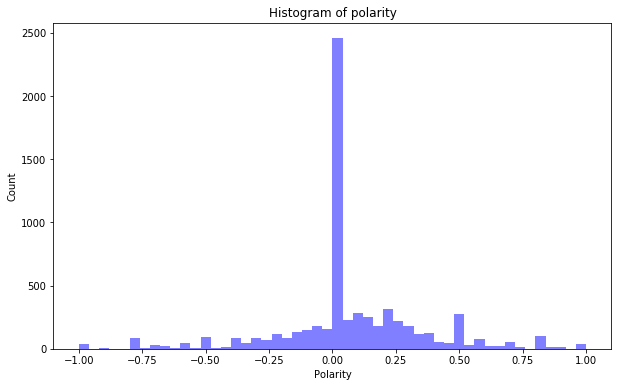

In [36]:
print('graphe de polarité')

from matplotlib import pyplot as plt
num_bins = 50
plt.figure(figsize=(10,6))
n, bins, patches = plt.hist(Sample.polarity, num_bins, facecolor='blue', alpha=0.5)
plt.xlabel('Polarity')
plt.ylabel('Count')
plt.title('Histogram of polarity')
plt.show()


polarité en fonction des likes


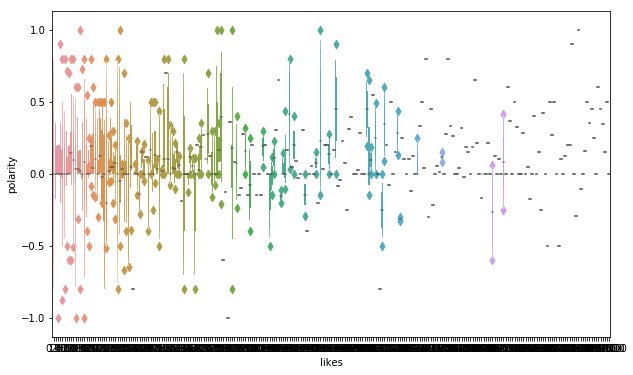

In [37]:
print('polarité en fonction des likes')

import seaborn as sns
plt.figure(figsize=(10,6))
sns.boxenplot(x='likes', y='polarity', data=Sample)
plt.show()

In [38]:
print('requetes sur dataframe')
Sample[Sample.polarity == -1].text.head()
Sample[(Sample.likes == 5) & (Sample.polarity == -1)].head()

requetes sur dataframe


,likes,text,polarity


In [39]:
print('discrétiser la variable classe')


Sample.loc[  (Sample.polarity < 0), 'polarity'] = -1

Sample.loc[  (Sample.polarity >0), 'polarity'] = 1

discrétiser la variable classe


In [40]:
#Clustering : KMEANS
print('vectorisation')
from sklearn.feature_extraction.text import TfidfVectorizer, TfidfTransformer
tv = TfidfVectorizer(min_df = 0.05, max_df = 0.5, max_features=1000, stop_words = 'english')
X = tv.fit_transform(Sample['text'])
vocab = tv.get_feature_names()

vectorisation


In [41]:
print('1) rate to matrice')
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
Sample['likes'] = le.fit_transform(Sample['likes'].astype(str))
print('2) fusionner les matrices')
from scipy.sparse import hstack
import numpy as np
X_train_dtm = hstack((X,np.array(Sample['likes'])[:,None]))
print(X.shape)
print(X_train_dtm.shape)


1) rate to matrice
2) fusionner les matrices
(6589, 16)
(6589, 17)


In [42]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_train_dtm,Sample['polarity'], random_state = 0)
print(Sample['polarity'])

0        1.0
7        0.0
8       -1.0
9        0.0
10       1.0
11       0.0
12       0.0
13      -1.0
14       0.0
15       1.0
16       0.0
17      -1.0
18       0.0
19       0.0
20      -1.0
21       1.0
22       0.0
23      -1.0
24      -1.0
25       1.0
26       0.0
27       1.0
28      -1.0
29       1.0
30       0.0
32       1.0
33       1.0
35       0.0
38       1.0
39       1.0
        ... 
14855   -1.0
14856    1.0
14861    1.0
14873    1.0
14874    1.0
14875    0.0
14876   -1.0
14880   -1.0
14881    0.0
14896    1.0
14909    1.0
14911    1.0
14915    1.0
14918   -1.0
14919   -1.0
14920   -1.0
14921   -1.0
14922    0.0
14923   -1.0
14925    1.0
14926    1.0
14946    1.0
14997    1.0
15024    0.0
15027    1.0
15029    0.0
15031    1.0
15056    1.0
15060    1.0
15062    1.0
Name: polarity, Length: 6589, dtype: float64


In [43]:
from sklearn.svm import SVC
svclassifier = SVC(kernel='linear')
svclassifier.fit(X_train, y_train)
from  sklearn.metrics  import accuracy_score
y_pred = svclassifier.predict(X_test)

In [44]:
from sklearn.metrics import classification_report, confusion_matrix
results = confusion_matrix(y_test, y_pred)
print ('Confusion Matrix :')
print(results)
print ('Accuracy Score :',accuracy_score(y_test, y_pred) )
print ('Report : ')
print (classification_report(y_test, y_pred))

Confusion Matrix :
[[  3 126 204]
 [  6 320 244]
 [  6 242 497]]
Accuracy Score : 0.4975728155339806
Report : 
             precision    recall  f1-score   support

       -1.0       0.20      0.01      0.02       333
        0.0       0.47      0.56      0.51       570
        1.0       0.53      0.67      0.59       745

avg / total       0.44      0.50      0.45      1648

